# 6 DoF Pose from Semantic Keypoints

In [59]:
from __future__ import division
from __future__ import print_function

import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from hourglass import hg
from tqdm import tqdm
from PIL import Image, ImageOps
import os
#from os import join
from time import time
import numpy as np
import cv2 
from utils import plot_mesh
from scipy.spatial.transform import Rotation
import matplotlib.image as mpimg

import random
import pandas as pd
from ipywidgets import interact

from sklearn.neighbors import KDTree

import datetime

os.makedirs('./output_drill/', exist_ok=True)

os.environ['KMP_DUPLICATE_LIB_OK']='True'

%matplotlib inline

## Dataset and data augmentation

In [16]:
class CalculateBoundingBox:
    def __init__(self, enlarge=1, random_offset_radius=0):
        self.enlarge = enlarge
        self.random_offset_radius = random_offset_radius
    
    def __call__(self, sample):
        enlarge = self.enlarge
        center = sample['center']
        scale = sample['scale']
        if type(enlarge) == tuple:
            enlarge = random.uniform(*enlarge)
        scale *= enlarge
            
        if self.random_offset_radius > 0:
            r = self.random_offset_radius * np.sqrt(random.random())
            theta = random.random() * 2 * np.pi
            x = r * np.cos(theta)
            y = r * np.sin(theta)
            center = np.array(center) + np.array([x,y])

        b = np.array([center[0]-scale*100, center[1]-scale*100, scale*200, scale*200])
        b[:2] = b[:2]
        b[2:] = b[2:]+b[0:2]
        sample['bb'] = np.array([ [b[0], b[1]], [b[0], b[3]], [b[2], b[1]], [b[2], b[3]] ]) 

        return sample

In [17]:
class RandomRotation:
    def rotate(self, p, origin=(0, 0), degrees=0):
        angle = np.deg2rad(degrees)
        R = np.array([[np.cos(angle), -np.sin(angle)],
                      [np.sin(angle),  np.cos(angle)]])
        o = np.atleast_2d(origin)
        p = np.atleast_2d(p)
        return np.squeeze((R @ (p.T-o.T) + o.T).T)
    
    def __init__(self, angle=(-90,90)):
        self.angle = angle
        
    def __call__(self, sample):
        angle = self.angle
        if type(angle) == tuple:
            angle = random.uniform(*angle)
        sample['orig_image'] = sample['image'].copy()
        if 'mask' in sample:
            sample['orig_mask'] = sample['mask'].copy()
            sample['mask'] = sample['mask'].rotate(angle, expand=True)
        im_center = np.array(sample['orig_image'].size)/2
        sample['image'] = sample['image'].rotate(angle, expand=True)
        new_im_center = np.array(sample['image'].size)/2
        keypoints = self.rotate(sample['keypoints'][:,:2] - im_center, degrees=-angle) + new_im_center
        sample['keypoints'] = np.concatenate([keypoints, sample['keypoints'][:, 2, None]], axis=1)
        sample['center'] = self.rotate(sample['center'][:2] - im_center, degrees=-angle) + new_im_center
        
        return sample

In [18]:
class RandomFlip:

    def __call__(self, sample):
        if bool(random.getrandbits(1)):
            sample['image'] = ImageOps.flip(sample['image'])
            if 'mask' in sample:
                sample['mask'] = ImageOps.flip(sample['mask'])
            sample['keypoints'] = np.stack([sample['keypoints'][:,0], 
                                            sample['image'].size[1] - sample['keypoints'][:,1], 
                                            sample['keypoints'][:,2]], axis=1)
            
            
        if bool(random.getrandbits(1)):
            sample['image'] = ImageOps.mirror(sample['image'])
            if 'mask' in sample:
                sample['mask'] = ImageOps.mirror(sample['mask'])
            sample['keypoints'] = np.stack([sample['image'].size[0] - sample['keypoints'][:,0], 
                                            sample['keypoints'][:,1],
                                            sample['keypoints'][:,2]], axis=1)

        return sample

In [19]:
class RandomColorJitter:
    def __init__(self, brightness=(0.7,1.5), contrast=0.5, saturation=0.5, hue=0.1):
        self.transform = transforms.ColorJitter(brightness=brightness, 
                                                contrast=contrast, 
                                                saturation=saturation, 
                                                hue=hue)
    
    def __call__(self, sample):
        sample['image'] = self.transform(sample['image'])
        return sample
    
class RandomSharpness:
    def __init__(self, sharpness_factor = (0,2), p=0):
        self.sharpness_factor = sharpness_factor
        self.p = p
    
    def __call__(self, sample):
        sharpness_factor = self.sharpness_factor
        if type(sharpness_factor) == tuple:
            sharpness_factor = random.uniform(*sharpness_factor)
        transform = transforms.RandomAdjustSharpness(sharpness_factor=sharpness_factor, p=self.p)
        sample['image'] = transform(sample['image'])
        return sample

In [20]:
#Transformations

def generate_heatmap(heatmap, pt, sigma):
    heatmap[int(min(heatmap.shape[0] - 1, pt[1]))][int(min(heatmap.shape[1] - 1, pt[0]))] = 1
    heatmap = cv2.GaussianBlur(heatmap, sigma, 0)
    am = np.amax(heatmap)
    heatmap /= am
    return heatmap


class CropAndPad:

    def __init__(self, out_size=(256,256)):
        self.out_size = out_size[::-1]

    def __call__(self, sample):
        image, bb = sample['image'], sample['bb']
        img_size = image.size
        min_x, min_y = bb.min(axis=0)
        max_x, max_y = bb.max(axis=0)
        center_x = (min_x + max_x) / 2
        center_y = (min_y + max_y) / 2
        width = max([max_x-min_x, max_y-min_y])
        min_x = int(center_x) - int(width)//2
        min_y = int(center_y) - int(width)//2
        max_x = int(center_x) + int(width)//2
        max_y = int(center_y) + int(width)//2
        sample['image'] = image.crop(box=(min_x,min_y,max_x,max_y))
        #sample['orig_image'] = image
        sample['center'] = np.array([center_x, center_y], dtype=np.float32)
        sample['min'] = np.array([min_x, min_y], dtype=np.float32)
        sample['scale'] = np.array([width/self.out_size[0]], dtype=np.float32)
        sample['width'] = width
        if width != self.out_size[0]:
            sample['image'] = sample['image'].resize(self.out_size)
        if 'mask' in sample:
            sample['mask'] = sample['mask'].crop(box=(min_x,min_y,max_x,max_y)).resize(self.out_size)
        if 'keypoints' in sample:
            keypoints = sample['keypoints']
            for i in range(keypoints.shape[0]):
                # if keypoints[i,2] != 0:
                if keypoints[i,0] < min_x or keypoints[i,0] > max_x or keypoints[i,1] < min_y or keypoints[i,1] > max_y:
                    keypoints[i,:] = [0,0,0]
                else:
                    keypoints[i,:2] = (keypoints[i,:2]-np.array([min_x, min_y]))*self.out_size/width
        sample['keypoints'] = keypoints
        sample.pop('bb')
        return sample

# Convert keypoint locations to heatmaps
class LocsToHeatmaps:

    def __init__(self, img_size=(256,256), out_size=(64,64), sigma=17):
        self.img_size = img_size
        self.out_size = out_size
        self.x_scale = 1.0 * out_size[0]/img_size[0]
        self.y_scale = 1.0 * out_size[1]/img_size[1]
        self.sigma=sigma
        x = np.arange(0, out_size[1], dtype=np.float)
        y = np.arange(0, out_size[0], dtype=np.float)
        self.yg, self.xg = np.meshgrid(y,x, indexing='ij')
        return

    def __call__(self, sample):
        sample['keypoint_locs'] = sample['keypoints'][:,:2]
        sample['visible_keypoints'] = sample['keypoints'][:,2]
        gaussian_hm = np.zeros((self.out_size[0], self.out_size[1], sample['keypoints'].shape[0]))
        for i,keypoint in enumerate(sample['keypoints']):
            if keypoint[2] != 0:
                gaussian_hm[:,:,i] = generate_heatmap(gaussian_hm[:,:,i], tuple(keypoint[:-1].astype(np.int) * self.x_scale), (self.sigma, self.sigma))
        sample['keypoint_heatmaps'] = gaussian_hm
        return sample

# Convert numpy arrays to Tensor objects
# Permute the image dimensions
class ToTensor:

    def __init__(self, downsample_mask=True):
        self.tt = transforms.ToTensor()
        self.downsample_mask=downsample_mask

    def __call__(self, sample):
        sample['image'] = self.tt(sample['image'])
        if 'orig_image' in sample:
            sample['orig_image'] = self.tt(sample['orig_image'])
        if 'orig_mask' in sample:
            sample['orig_mask'] = self.tt(sample['orig_mask'])
        if 'mask' in sample:
            if self.downsample_mask:
                sample['mask'] = self.tt(sample['mask'].resize(sample['keypoint_heatmaps'].shape[:2], Image.ANTIALIAS)) * 255
            else:
                sample['mask'] = self.tt(sample['mask'])
        if 'in_mask' in sample:
            sample['in_mask'] = self.tt(sample['in_mask'])
            # sample['in_mask'] = sample['in_mask'].unsqueeze(0)
        if 'keypoint_heatmaps' in sample:
            sample['keypoint_heatmaps'] =\
                torch.from_numpy(sample['keypoint_heatmaps'].astype(np.float32).transpose(2,0,1))
            sample['keypoint_locs'] =\
                torch.from_numpy(sample['keypoint_locs'].astype(np.float32))
            sample['visible_keypoints'] =\
                torch.from_numpy(sample['visible_keypoints'].astype(np.float32))
        if 'keypoint_heatmaps' in sample and 'mask' in sample:
            sample['key_mask'] = torch.concat([sample['keypoint_heatmaps'], sample['mask']])
        return sample

class Normalize:

    def __call__(self, sample):
        sample['image'] = 2*(sample['image']-0.5)
        if 'in_mask' in sample:
            sample['in_mask'] = 2*(sample['in_mask']-0.5)
        return sample

In [75]:
class Dataset(Dataset):

    def __init__(self, mask_path, data_path, transform=None, num_classes=9):
        self.mask_path = mask_path
        self.data_path = data_path
        self.transform = transform
        self.label = dict(np.load('../models_labels.npz'))[object_name].item()
        data = np.load(data_path)
        self.masks = None

        self.imgname = data['imgname']
        self.keypoints = data['part']
        self.center = data['center']
        self.scale = data['scale']
        if 'target_weight' in data:
            self.keypoints = np.concatenate([self.keypoints, data['target_weight'][:,:,None]], axis=-1)
        else:
            self.keypoints = np.concatenate((self.keypoints, np.ones((self.keypoints.shape[0],num_classes,1))), axis=-1)

    def __len__(self):
        return self.imgname.shape[0]

    def __getitem__(self, idx):
        # ensure there aren't conflicting file pointers

        image = Image.fromarray(np.array((mpimg.imread('../' + self.imgname[idx]) * 255).astype(np.uint8)))

        keypoints = self.keypoints[idx].copy()
        item = {'image': image, 'center': self.center[idx].copy(), 'scale': self.scale[idx].copy(), 'keypoints': keypoints}
        
        mask = np.array((((mpimg.imread('../' + self.imgname[idx].replace('color', 'label')) * 255) == self.label).astype(np.uint8)))
        mask = Image.fromarray(mask)
        item['mask'] = mask
        
        if self.transform is not None:
            item = self.transform(item)
        return item

## Object data

In [76]:
object_name = 'power_drill'

## Training

In [77]:
class Trainer(object):

    def __init__(self, mask_path, train_data_path, test_data_path, output_dir, resume=False, 
                 checkpoint_path="", num_classes=9, num_stacks=3, num_blocks=1, trainMasks=False, in_size = 512,
                 sigma=17):
        self.trainMasks = trainMasks
        self.output_dir = output_dir
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        train_transform_list = [RandomRotation(),
                                CalculateBoundingBox(enlarge=(1,1.5), random_offset_radius=5),
                                CropAndPad(out_size=(in_size, in_size)),
                                RandomFlip(),
                                RandomColorJitter(),
                                RandomSharpness(),
                                LocsToHeatmaps(img_size=(in_size,in_size), out_size=(int(in_size/4), int(in_size/4)), sigma=sigma),
                                ToTensor(),
                                Normalize()]
        test_transform_list = [CalculateBoundingBox(),
                               CropAndPad(out_size=(in_size, in_size)),
                               LocsToHeatmaps(img_size=(in_size,in_size), out_size=(int(in_size/4), int(in_size/4)), sigma=sigma),
                               ToTensor(),
                               Normalize()]
        self.train_ds = Dataset(mask_path=mask_path,
                                data_path=train_data_path, 
                                transform=transforms.Compose(train_transform_list),
                                num_classes=num_classes)
        self.test_ds = Dataset(mask_path=mask_path,
                               data_path=test_data_path, 
                               transform=transforms.Compose(test_transform_list),
                               num_classes=num_classes)

        self.model = hg(num_stacks=num_stacks, num_blocks=num_blocks,
                        num_classes=num_classes+(1 if self.trainMasks else 0)).to(self.device)
        self.history = []
        if resume:
            checkpoint = torch.load(checkpoint_path)
            self.model.load_state_dict(checkpoint['model'])
            self.history = checkpoint['history']
            
        # define loss function and optimizer
        self.heatmap_loss = torch.nn.MSELoss().to(self.device) # for Global loss
        self.optimizer = torch.optim.RMSprop(self.model.parameters(),
                                             lr = 2.5e-4)
        self.train_data_loader = DataLoader(self.train_ds, batch_size=4,
                                            num_workers=0,
                                            pin_memory=True,
                                            shuffle=True)
        self.test_data_loader = DataLoader(self.test_ds, batch_size=32,
                                           num_workers=0,
                                           pin_memory=True,
                                           shuffle=True)

        self.summary_iters = []
        self.losses = []
        self.pcks = []

    def train(self, max_epoch=5):
        self.total_step_count = 0
        first_epoch_num = 0 if len(self.history) == 0 else self.history[-1]['epoch']
        start_time = time()
        for epoch in range(first_epoch_num+1,max_epoch+1):

            print("Epoch %d/%d"%
                    (epoch,max_epoch))
            
            sum_loss = 0
            loss_counts = 0
            pbar = tqdm(self.train_data_loader)
            for step, batch in enumerate(pbar):
                self.model.train()
                batch = {k: v.to(self.device) if isinstance(v, torch.Tensor) else v for k,v in batch.items()}
                self.optimizer.zero_grad()
                pred_heatmap_list = self.model(batch['image'])
                loss = 0
                for i, pred_heatmap in enumerate(pred_heatmap_list):
                    gt = batch['key_mask'] if self.trainMasks else batch['keypoint_heatmaps']
                    loss += self.heatmap_loss(pred_heatmap, gt) * (1/(len(pred_heatmap_list) - i))
                sum_loss += loss.detach().cpu().numpy()
                loss_counts += 1
                pbar.set_description(f"Epoch: {epoch}, Loss: {loss.detach().cpu().numpy()}")
                loss.backward()
                self.optimizer.step()                                          
                
                self.total_step_count += 1
                            
            sum_valid_loss = 0
            valid_loss_counts = 0
            for step, batch in enumerate(tqdm(self.test_data_loader)):
                self.model.eval()
                loss = 0
                with torch.no_grad():
                    pred_heatmap_list = self.model(batch['image'].to(self.device))
                    gt = batch['key_mask'] if self.trainMasks else batch['keypoint_heatmaps']
                    loss = self.heatmap_loss(pred_heatmap_list[-1], gt.to(self.device))
                sum_valid_loss += loss.cpu().numpy()
                valid_loss_counts += 1
            
            history_note = {'epoch': epoch, 'avg_train_loss': (sum_loss/loss_counts), 
                            'avg_valid_loss': (sum_valid_loss/valid_loss_counts)}
            print(history_note)
            self.history.append(history_note)
                
            checkpoint = {'model': self.model.state_dict(), 'history': self.history}
            torch.save(checkpoint, f'{self.output_dir}/model_checkpoint_epoch{epoch}.pt')

        checkpoint = {'model': self.model.state_dict(), 'history': self.history}
        torch.save(checkpoint, f'{self.output_dir}/model_checkpoint.pt')

In [78]:
def get_object_num_classes(data_path):
    return np.load(data_path)['part'].shape[1]

In [90]:
def create_trainer_for_object(object_name, resume=False, checkpoint_path="", trainMasks=True, in_size=512, sigma=17):
    train_data_path='data_objects/' + object_name + '_train_data.npz'
    test_data_path='data_objects/' + object_name + '_valid_data.npz'
    num_classes=get_object_num_classes(test_data_path)
    output_dir='./output_' + object_name + '/model' + ('_mask_' if trainMasks else '_no_mask_') \
                + str(num_classes) + 'classes_' \
                + 'sigma' + str(sigma) + '_size' + str(in_size) + '_' + datetime.datetime.now().strftime("%Y-%m-%d_%H_%M_%S")
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    return Trainer(mask_path=None,
                   train_data_path=train_data_path,
                   test_data_path=test_data_path,
                   output_dir=output_dir,
                   resume=resume,
                   checkpoint_path=checkpoint_path,
                   num_classes=num_classes,
                   trainMasks=trainMasks,
                   in_size = in_size,
                   sigma=sigma)

In [91]:
trainer = create_trainer_for_object(object_name, resume=False, checkpoint_path="", trainMasks=False, 
                                    in_size=512, sigma=21)

C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/1788017810.py:59: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  x = np.arange(0, out_size[1], dtype=np.float)
C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/1788017810.py:60: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y = np.arange(0, out_size[0], dtype=np.float)


### Network and data visualisation

C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/1788017810.py:70: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  gaussian_hm[:,:,i] = generate_heatmap(gaussian_hm[:,:,i], tuple(keypoint[:-1].astype(np.int) * self.x_scale), (self.sigma, self.sigma))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


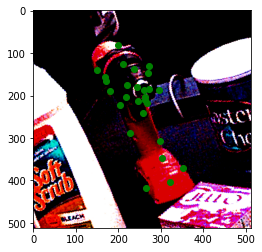

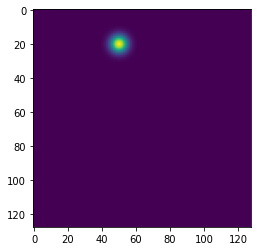

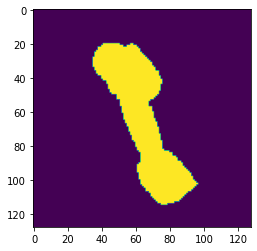

In [92]:
item = trainer.train_ds[0]
plt.imshow(np.moveaxis(item['image'].numpy(), 0, -1))
kp = item['keypoints']
for k in kp:
    plt.scatter(k[0,None], k[1,None], color='green' if k[2] else 'yellow')
plt.show()
plt.imshow(item['keypoint_heatmaps'].numpy()[7])
plt.show()
plt.imshow(item['key_mask'][27])
plt.show()

In [93]:
from torchsummary import summary

summary(trainer.model, (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,472
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
              ReLU-4         [-1, 64, 256, 256]               0
              ReLU-5         [-1, 64, 256, 256]               0
              ReLU-6         [-1, 64, 256, 256]               0
       BatchNorm2d-7         [-1, 64, 256, 256]             128
              ReLU-8         [-1, 64, 256, 256]               0
            Conv2d-9         [-1, 64, 256, 256]           4,160
      BatchNorm2d-10         [-1, 64, 256, 256]             128
             ReLU-11         [-1, 64, 256, 256]               0
           Conv2d-12         [-1, 64, 256, 256]          36,928
      BatchNorm2d-13         [-1, 64, 256, 256]             128
             ReLU-14         [-1, 64, 2

### Training process and results

In [94]:
trainer.train(max_epoch=5)

Epoch 1/5


  0%|                                                                                         | 0/5238 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/1788017810.py:70: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  gaussian_hm[:,:,i] = generate_heatmap(gaussian_hm[:,:,i], tuple(keypoint[:-1].astype(np.int) * self.x_scale), (self.sigma, self.sigma))
100%|████████████████████████████████████████████████████████████████████████████████| 217/217 [05:09<00:00,  1.43s/it]


{'epoch': 1, 'avg_train_loss': 0.003259892328388053, 'avg_valid_loss': 0.26066962722259734}
Epoch 2/5


100%|████████████████████████████████████████████████████████████████████████████████| 217/217 [04:48<00:00,  1.33s/it]


{'epoch': 2, 'avg_train_loss': 0.0017475803133573044, 'avg_valid_loss': 0.0018488005777898197}
Epoch 3/5


100%|████████████████████████████████████████████████████████████████████████████████| 217/217 [04:50<00:00,  1.34s/it]


{'epoch': 3, 'avg_train_loss': 0.001213976399861109, 'avg_valid_loss': 0.041420643724295124}
Epoch 4/5


Epoch: 4, Loss: 0.0010919506894424558:   8%|███▏                                    | 422/5238 [02:52<32:47,  2.45it/s]


KeyboardInterrupt: 

In [95]:
def plot_trainer_history(trainer):
    history = trainer.history
    train_losses = [x['avg_train_loss'] for x in history]
    valid_losses = [x['avg_valid_loss'] for x in history]
    plt.plot(list(range(len(train_losses))), train_losses, label="Train loss")
    plt.plot(list(range(len(valid_losses))), valid_losses, label="Validation loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training history")
    plt.legend()

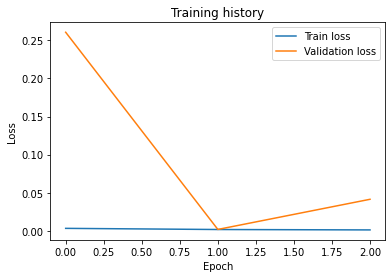

In [96]:
plot_trainer_history(trainer)

## Testing

In [97]:
def predict_with_model(checkpoint_path, object_name, num_classes, num_stacks=3, num_blocks=1, enlarge = 1.2, use_masks = False, sigma=17):
    num_classes += (1 if use_masks else 0)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = hg(num_stacks=num_stacks, num_blocks=num_blocks, num_classes=num_classes).to(device)
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model'])
    transform_list = [CalculateBoundingBox(enlarge=enlarge), CropAndPad(out_size=(512,512))]
    transform_list.append(LocsToHeatmaps(img_size=(512,512), out_size=(128, 128), sigma=sigma))
    transform_list.append(ToTensor())
    transform_list.append(Normalize())
    test_ds = Dataset(mask_path=None,
                      data_path='data_objects/' + object_name + '_valid_data.npz',
                      transform=transforms.Compose(transform_list),
                      num_classes=num_classes)
    data_loader = DataLoader(test_ds, batch_size=1, pin_memory=True, shuffle=False)
    predicted_heatmaps = np.zeros((len(test_ds), num_classes, 128, 128))
    for i, batch in enumerate(tqdm(data_loader)):
        model.eval()
        images = batch['image'].to(device)
        with torch.no_grad():
            pred_heatmap_list = model(images)
        pred_heatmaps = pred_heatmap_list[-1]
        predicted_heatmaps[i,:,:,:] = pred_heatmaps[0,:,:,:].cpu().numpy()
    np.save(f'./output_{object_name}/detections.npy', predicted_heatmaps)
    return predicted_heatmaps

In [98]:
def heatmaps_to_locs(heatmaps, out_size = (64, 64)):
    conf = np.max(heatmaps, axis=(-2,-1))
    locs = np.argmax(heatmaps.reshape((*heatmaps.shape[:2], -1)), axis=-1)
    locs = np.stack(np.unravel_index(locs, out_size)[::-1], axis=-1) # reverse x,y
    return torch.from_numpy(np.concatenate([locs, conf[..., None]], axis=-1).astype('float32'))

In [99]:
def estimate_pos(keypoints_3d, keypoints_2d, K, rvec=None, tvec=None, flags=cv2.SOLVEPNP_SQPNP, useExtrinsicGuess=False):
    dist_coeffs = np.zeros((4,1))
    success, rotation_vector, translation_vector = cv2.solvePnP(keypoints_3d.astype(np.double), keypoints_2d.astype(np.double),
                                                            K.astype(np.double), dist_coeffs.astype(np.float32),
                                                            flags=flags,
                                                            rvec = rvec,
                                                            tvec = tvec,
                                                            useExtrinsicGuess=useExtrinsicGuess)

    R = Rotation.from_rotvec(rotation_vector.T[0]).as_matrix()
    t = translation_vector

    return R, t

In [100]:
def estimate_pos_ransac(keypoints_3d, keypoints_2d, K, rvec=None, tvec=None, flags=cv2.SOLVEPNP_SQPNP, useExtrinsicGuess=False):
    dist_coeffs = np.zeros((4,1))
    success, rotation_vector, translation_vector,_ = cv2.solvePnPRansac(keypoints_3d.astype(np.double), keypoints_2d.astype(np.double),
                                                            K.astype(np.double), dist_coeffs.astype(np.float32),
                                                            flags=flags,
                                                            rvec = rvec,
                                                            tvec = tvec,
                                                            useExtrinsicGuess=useExtrinsicGuess,
                                                            iterationsCount = 100,
                                                            reprojectionError = 8.0,
                                                            confidence = 0.99)
    
    R = Rotation.from_rotvec(rotation_vector.T[0]).as_matrix()
    t = translation_vector
    
    return R, t

In [103]:
enlarge = 1.2
use_masks = False
metadata = np.load(f'data_objects/{object_name}_meta_data.npz', allow_pickle=True)
valid_data = np.load(f'data_objects/{object_name}_valid_data.npz', allow_pickle=True)
num_classes = len(metadata['keypoints_3d'])
keypoints_3d = metadata['keypoints_3d']
poses = metadata['poses'].item()
imgnames = valid_data['imgname']
scales = valid_data['scale'][:,None] * enlarge
centers = valid_data['center']
keypoints2d_gt = valid_data['part']
verts = metadata['verts']
diameter = np.load('data_objects/models_diameters.npz')[object_name]
test_sigma=17

In [104]:
predicted_heatmaps = predict_with_model(checkpoint_path=f'./output_{object_name}/model_no_mask_27classes_sigma21_size512_2022-09-07_18_54_21/model_checkpoint_epoch3.pt', 
                                        object_name=object_name,
                                        num_classes=num_classes,
                                        enlarge = enlarge, use_masks = use_masks, sigma=test_sigma)

C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/1788017810.py:59: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  x = np.arange(0, out_size[1], dtype=np.float)
C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/1788017810.py:60: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y = np.arange(0, out_size[0], dtype=np.float)
  0%|               

In [117]:
predicted_heatmaps = np.load(f'./output_{object_name}/backup_64_64/detections.npy')

In [118]:
predicted_heatmaps.shape

(6932, 27, 64, 64)

In [119]:
out_size = (64, 64)
keypoint_locs = heatmaps_to_locs(predicted_heatmaps[:,:-1], out_size) if use_masks else heatmaps_to_locs(predicted_heatmaps, out_size)
# Compute detected 2D keypoint locations in the original image
ul_corner = centers - scales * 100
keypoint_locs[:,:,:-1] *= (scales[:,:,None]*200) / out_size[0]
keypoint_locs[:,:,:-1] += ul_corner[:,None,:]

### Compute score

In [120]:
def compute_add_score(pts3d, diameter, pose_gt, pose_pred, percentage=0.1):
    R_gt, t_gt = pose_gt
    R_pred, t_pred = pose_pred
    count = R_gt.shape[0]
    mean_distances = np.zeros((count,), dtype=np.float32)
    for i in range(count):
        pts_xformed_gt = np.matmul(R_gt[i], pts3d.T) + t_gt[i]        
        pts_xformed_pred = np.matmul(R_pred[i], pts3d.T) + t_pred[i]
        distance = np.linalg.norm(pts_xformed_gt - pts_xformed_pred, axis=0)
        mean_distances[i] = np.mean(distance)            

    threshold = diameter * percentage
    score = (mean_distances < threshold).sum() / count
    return score, mean_distances

In [121]:
def compute_adds_score(pts3d, diameter, pose_gt, pose_pred, percentage=0.1):
    R_gt, t_gt = pose_gt
    R_pred, t_pred = pose_pred

    count = R_gt.shape[0]
    mean_distances = np.zeros((count,), dtype=np.float32)
    for i in range(count):
        if np.isnan(np.sum(t_pred[i])):
            mean_distances[i] = np.inf
            continue
        pts_xformed_gt = np.matmul(R_gt[i], pts3d.T) + t_gt[i]
        pts_xformed_pred = np.matmul(R_pred[i], pts3d.T) + t_pred[i]
        kdt = KDTree(pts_xformed_gt.transpose(), metric='euclidean')
        distance, _ = kdt.query(pts_xformed_pred.transpose(), k=1)
        mean_distances[i] = np.mean(distance)
    threshold = diameter * percentage
    score = (mean_distances < threshold).sum() / count
    return score, mean_distances

In [122]:
R_preds = []
R_gts = []
t_preds = []
t_gts = []

for idx in tqdm(range(len(imgnames))):
    name = imgnames[idx]
    pose = poses[name]
    R_gts.append(pose['R'])
    t_gts.append(pose['t'])
    threshold = 0.1
    k_2 = np.array([k[:2].numpy() for k in keypoint_locs[idx] if k[2] > threshold])
    #k_2 = np.array([dataset['part'][idx][i][:2] for i, k in enumerate(keypoint_locs[idx]) if k[2] > threshold])
    k_3 = np.array([keypoints_3d[i] for i, k in enumerate(keypoint_locs[idx]) if k[2] > threshold])
    if len(k_2) < 3:
        k_2 = keypoint_locs[idx,:,:2]
        k_3 = keypoints_3d
    try:
        K = pose['K']
        R_pred, t_pred = estimate_pos_ransac(k_3, k_2, K, flags=cv2.SOLVEPNP_SQPNP)
        R_preds.append(R_pred)
        t_preds.append(t_pred)
    except:
        print(idx)
        R_preds.append(np.zeros((3,3)))
        t_preds.append(np.zeros((3,1)))
    
R_preds = np.array(R_preds)
R_gts = np.array(R_gts)
t_preds = np.array(t_preds)
t_gts = np.array(t_gts)

 54%|█████████████████████████████████████████▎                                  | 3769/6932 [00:04<00:01, 1737.27it/s]

3844
3845
3846
3849
3850
3851
3853
3854
3857
3860
3866
3872
3879
3880


100%|█████████████████████████████████████████████████████████████████████████████| 6932/6932 [00:10<00:00, 656.49it/s]


In [123]:
score, distances = compute_add_score(keypoints_3d, diameter, pose_gt=(R_gts,t_gts), pose_pred=(R_preds,t_preds), percentage=0.1)
print(f"Add score: {score}")

Add score: 0.3104443162146567


In [124]:
score, distances = compute_adds_score(keypoints_3d, diameter, pose_gt=(R_gts,t_gts), pose_pred=(R_preds,t_preds), percentage=0.1)
print(f"Add-s score: {score}")

Add-s score: 0.36641661858049623


### Visualise predictions

In [125]:
def plot_vertices(vertices, R, t, K):
    verts_2d = np.matmul(K, np.matmul(R, vertices.T) + t).T
    verts_2d = verts_2d[:,:2] / verts_2d[:,2,None]
    plt.scatter(verts_2d[:,0], verts_2d[:,1], alpha=0.1)

In [126]:
def plot_predicted_keypoints(keypoint_locs, dataset, threshold=0.3):
    for i in range(len(keypoint_locs[idx])):
        plt.annotate(f"{i}", (keypoint_locs[idx][i][0], keypoint_locs[idx][i][1]), color="black")
        
        if keypoint_locs[idx][i][2] > threshold:
            plt.scatter(keypoint_locs[idx,i,0,None], keypoint_locs[idx,i,1,None], color="orange")
            plt.plot([keypoint_locs[idx][i][0], dataset['part'][idx][i][0]],
                     [keypoint_locs[idx][i][1], dataset['part'][idx][i][1]], color='red')
        else:
            plt.scatter(keypoint_locs[idx,i,0,None], keypoint_locs[idx,i,1,None], color="red")
        
        if 'target_weight' in dataset:
            if dataset['target_weight'][idx][i] > 0:
                plt.scatter(dataset['part'][idx][i,0,None], dataset['part'][idx][i,1,None], color='green')
            else:
                plt.scatter(dataset['part'][idx][i,0,None], dataset['part'][idx][i,1,None], color='yellow')

In [127]:
def visualize_prediction(idx, k_3, k_2, name, R, t, K, dataset, use_masks=False):
    image = mpimg.imread('../' + name)
    plt.imshow(image, alpha=1)
    plot_vertices(verts, R, t, K)
    #plt.scatter(keypoint_locs[idx,:,0], keypoint_locs[idx,:,1])
    #plt.scatter(dataset['part'][idx][:,0,None], dataset['part'][idx][:,1,None], color='green')
    plot_predicted_keypoints(keypoint_locs, dataset)
    plt.scatter(k_2[:,0,None], k_2[:,1,None], color='purple')

In [128]:
def visualize_by_idx(idx, keypoint_locs, dataset, use_masks = False):
    threshold = 0.1
    k_2 = np.array([k[:2].numpy() for i, k in enumerate(keypoint_locs[idx]) if k[2] > threshold])
    k_3 = np.array([keypoints_3d[i]  for i, k in enumerate(keypoint_locs[idx]) if k[2] > threshold])
    name = imgnames[idx]
    K = poses[name]['K']
    R, t = estimate_pos_ransac(k_3, k_2, K, flags=cv2.SOLVEPNP_SQPNP)
    visualize_prediction(idx, k_3, k_2, name, R, t, K, dataset, use_masks)

In [129]:
len(verts)

2621

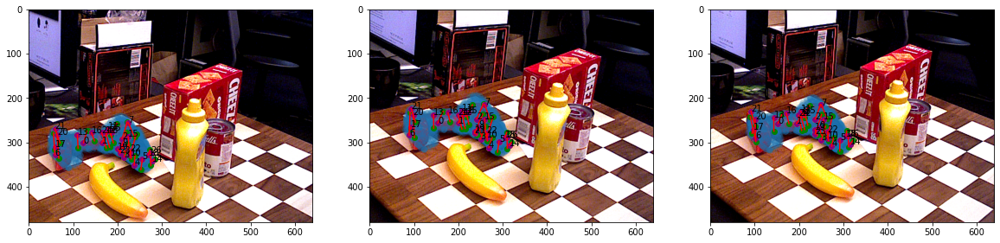

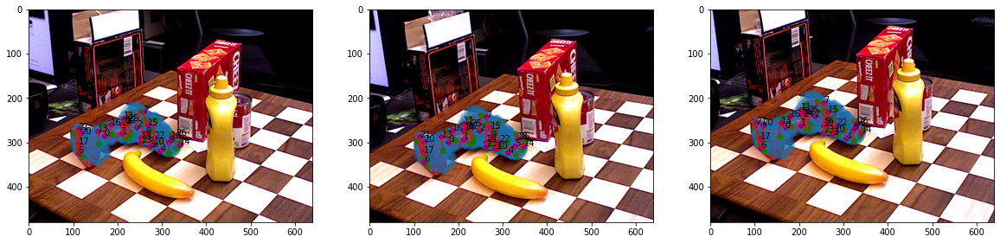

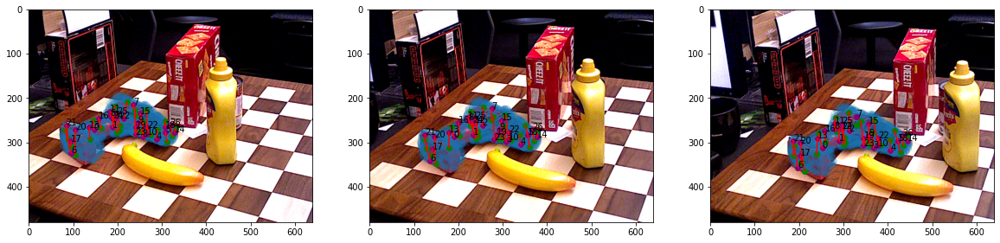

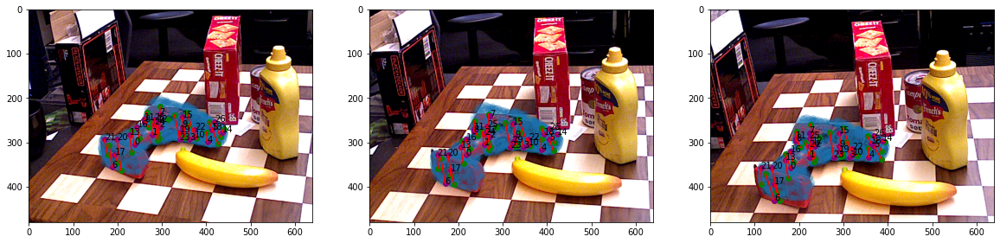

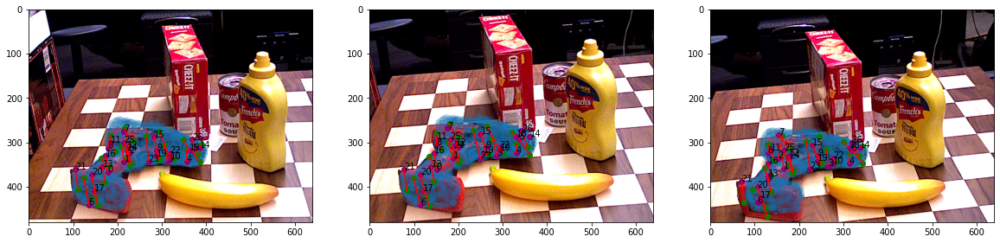

...

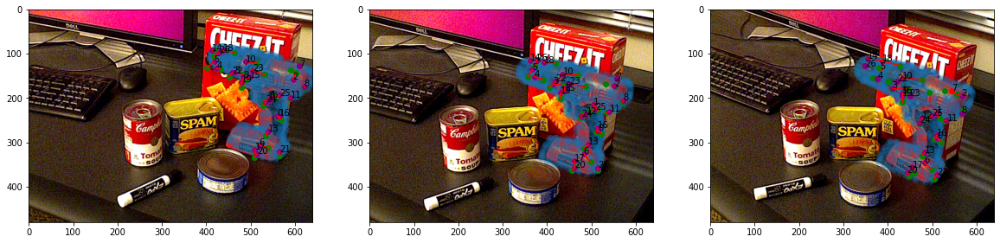

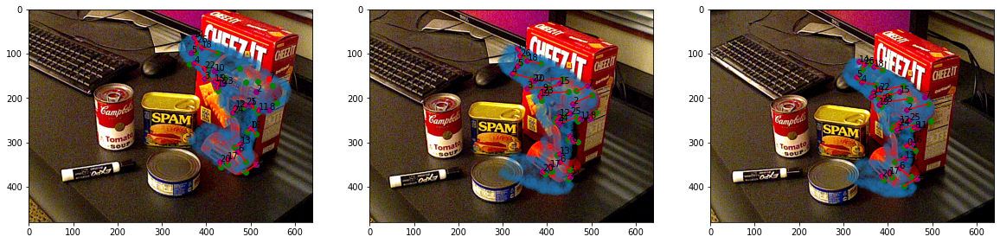

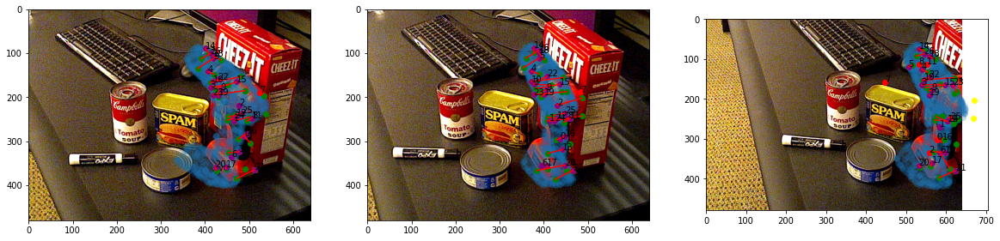

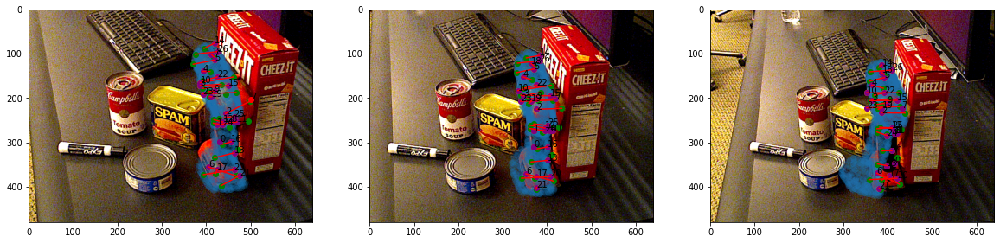

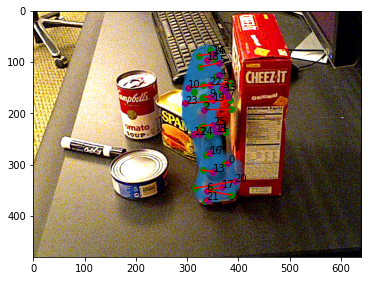

In [130]:
for i_row, idx in enumerate(range(0,len(imgnames),100)):
    row_cnt = 3
    if(i_row%row_cnt==0):
        plt.figure(figsize=(20,20))
    plt.subplot(1,3,(i_row%row_cnt)+1)
    visualize_by_idx(idx, keypoint_locs, valid_data)
    if(i_row%row_cnt==(row_cnt-1)):
        plt.show()

In [152]:
64 * 0.05

3.2

In [171]:
valid_data['target_weight'][idx][n_key]

1

In [172]:
threshold = 64 * 0.05

good_keypoints_counter = [0] * num_classes

for idx in tqdm(range(len(imgnames))):
    for n_key in range(num_classes):
        pred_keypoint = ((keypoint_locs[idx][n_key,:-1].numpy() - ul_corner[idx,None,:]) * out_size[0] / 200)
        gt_keypoint = ((valid_data['part'][idx][n_key,:] - ul_corner[idx,None,:]) * out_size[0] / 200)
        dist = np.linalg.norm(pred_keypoint - gt_keypoint)
        
        if (keypoint_locs[idx][n_key,2] < 0.1 and valid_data['target_weight'][idx][n_key] < 0.5) or dist <= threshold:
            good_keypoints_counter[n_key] += 1


100%|██████████████████████████████████████████████████████████████████████████████| 6932/6932 [09:06<00:00, 12.69it/s]


In [176]:
print("PDJ: " + str(np.mean(np.array(good_keypoints_counter) / len(imgnames))))

PDJ: 0.41240836913081574


In [131]:
def generate_test_heatmap(keypoint_loc, scale, weight, sigma = 11, out_size = (128, 128)):
    gaussian_hm = np.zeros((out_size[0], out_size[1], 1))
    if weight != 0:
        gaussian_hm[:,:,0] = generate_heatmap(gaussian_hm[:,:,0], tuple(keypoint_loc.astype(np.int) / (200 * scale) * out_size[0]), (sigma, sigma))
    return gaussian_hm

tensor([123.0687, 300.9133,   0.6160])


C:\Users\Admin\AppData\Local\Temp/ipykernel_22056/3752361042.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  gaussian_hm[:,:,0] = generate_heatmap(gaussian_hm[:,:,0], tuple(keypoint_loc.astype(np.int) / (200 * scale) * out_size[0]), (sigma, sigma))


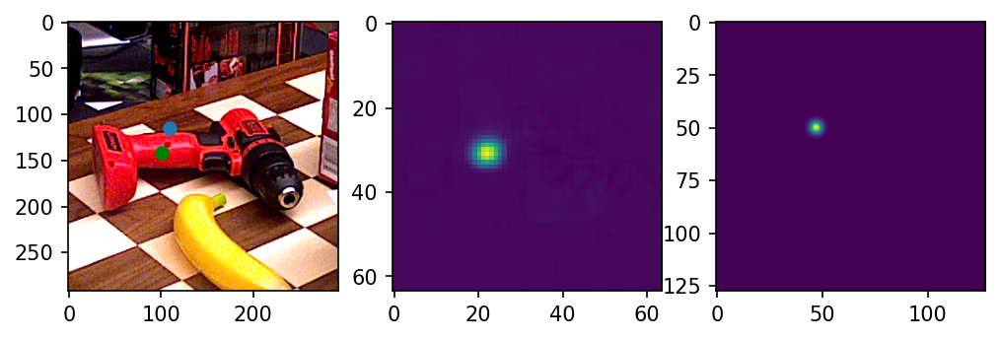

In [154]:
idx = 0#3846
n_key = 0

name = imgnames[idx]
image = (mpimg.imread('../' + name)* 255).astype(np.uint8)
sc = scales[idx]
left  = int(centers[idx][0] - sc * 100)
right = int(centers[idx][0] + sc * 100)
up    = int(centers[idx][1] - sc * 100)
down  = int(centers[idx][1] + sc * 100)
#img_cut = image[up:down, left:right]
img_cut = Image.fromarray(image).crop(box=[left, up, right, down])

gt_point = np.array([valid_data['part'][idx][n_key,0] - left, valid_data['part'][idx][n_key,1] - up])

print(keypoint_locs[idx][n_key])
plt.figure(figsize=(8, 6), dpi=150)
plt.subplot(1,3,1)
plt.scatter(keypoint_locs[idx][n_key,0,None] - left, keypoint_locs[idx][n_key,1,None] - up, color="green" if keypoint_locs[idx][n_key,2] > 0.3 else "red")
plt.scatter(valid_data['part'][idx][n_key,0,None] - left, valid_data['part'][idx][n_key,1,None] - up, color="C0")
plt.imshow(img_cut)
plt.subplot(1,3,2)
plt.imshow(predicted_heatmaps[idx][n_key])
plt.subplot(1,3,3)
plt.imshow(generate_test_heatmap(gt_point, sc, valid_data['target_weight'][idx][n_key]))
plt.show()
if use_masks:
    plt.imshow(predicted_heatmaps[idx][num_classes])
    plt.show()